# **Anime Sketch Colorization Pair**






**Problem statement:**

For a given sketch generate a Color Image

**Data Overview**

Taken data from Danbooru Sketch Pair 128x on kaggle https://www.kaggle.com/wuhecong/danbooru-sketch-pair-128x

We are given two Folders:-

- Skecth - Having  sketch images

- Color - Having corresponding Colored images.

We will pick some images from these folders to train the model and then test it on some pairs not seen by the model.


**Real-world/Business objectives and constraints.**

*   No low-latency requirement.
*   Images generated should have colors same as original image and shouldn't be blurred.


**Performance metric for supervised learning:**


*   Mean Absolute Error/  L1 Loss (L1 dist per pixel)
*   Binary Cross Entropy loss to predict image generated is real or fake(for GAN models)
 




**Solution :-**

We will try to generate Color Images using below models -
 - Unet model to minimize Mean Absolute error at Pixel Level.
 - GAN model to minimize binary cross-entropy loss for real vs fake images(model generated image) and L1 loss at pixel level.

**1. Download the Images.**

In [1]:
# !wget --header="Host: storage.googleapis.com" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/79.0.3945.88 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header="Accept-Language: en-US,en;q=0.9" --header="Referer: https://www.kaggle.com/" "https://storage.googleapis.com/kaggle-data-sets/198718/800362/bundle/archive.zip?GoogleAccessId=web-data@kaggle-161607.iam.gserviceaccount.com&Expires=1580492869&Signature=eAmxDBdJhjJJdd2PrKgXf%2BH2fTr2Z7VP1ufKsDOT4688y0l2sVdACXz4d7dsTbtafNrsev%2FFtvsd1v0uhnC4hju5zN84drEdyVanjKA1ismROh7xlBwFxmbLeCXrvHodMLfAUrZUfy2021IShchTvXlc0L6QfOJKVXilD%2FUWZPIBSl9oFFfWIla8ORTghLpsxItPo05B6YRHchddChfwGXXldA6it7%2F0PhHHG3dq1exzPqp9mOWpZVX2C491MdVyvJBEwnrTJ%2FvuwphUMLIxy2CNWPT1ayrii%2FmuLVmqQTuMbNNMTtE3HYHQTj4Z5iqw0QPbIWptjHhj%2FwH1DQ2fCw%3D%3D&response-content-disposition=attachment%3B+filename%3Ddanbooru-sketch-pair-128x.zip" -O "danbooru-sketch-pair-128x.zip" -c

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# #Extract Images from zip folder.
# #Ref- https://stackoverflow.com/questions/3451111/unzipping-files-in-python
# from zipfile import ZipFile
# with ZipFile('danbooru-sketch-pair-128x.zip', 'r') as zf:
#     zf.extractall('sketch-pair/')

**2. Import Required Libraries.**

In [4]:
#Import all the required libraries. 
import warnings #Suppress warning. 
warnings.filterwarnings("ignore")

from keras.layers import Activation, Dense, Dropout, Flatten, Input, Add, Conv2D, Conv2DTranspose, LeakyReLU #Keras Layers.
from tensorflow.keras.layers import (
    BatchNormalization, Dropout, Dense
)
from keras.models import Model #Keras Model
from tensorflow.keras.optimizers import Adam #Adam Optimizer.
from keras import losses #Keras Loss function.
import numpy as np #Numpy array handling.
import os #System variables.
import random #Library to generate random numbers
import cv2 #Image processing.
from google.colab.patches import cv2_imshow #library to show images in Colab
import matplotlib.pyplot as pyplot #Plotting graphs
from datetime import datetime #Using this library for timer.


**3. Load Data**

In [58]:
data_path = '/content/drive/MyDrive/CSE-803-Project/'

In [59]:
#Load Name of files.

img_name = [] #Array to store name of the image.

for i in  range(1): #Processing first 15 folders.
  folder=i.__str__().zfill(4) #Printing Folder number in 4 byte format.
  loc = data_path+'danbooru-sketch-pair-128x/color/sketch/' + folder + '/' #location of sketch images.
  for filename in os.listdir(loc):    #Process each image from the current folder.
    img_name.append(folder+'/'+filename)  #Store folder + filename.

In [60]:
print('Total number of images:',len(img_name))

Total number of images: 2016


In [100]:
#Generate List of Train, test and validation images.
# img_tr  = img_name[0:10000]
# img_val = img_name[10000:11500]
# img_tst = img_name[11500:13000]

img_tr  = img_name[0:1280]
img_val = img_name[1280:1600]
img_tst = img_name[1600:1920]

In [101]:
#Sample name of an image
img_tr[0]

'0000/240000.png'

In [102]:
#Length of train, test and validation data.
print('Number of images in train data:',len(img_tr))
print('Number of images in validation data:',len(img_val))
print('Number of images in test data:',len(img_tst))

Number of images in train data: 1280
Number of images in validation data: 320
Number of images in test data: 320


In [103]:
#Initialize batch pointers.
train_batch_pointer = 0
val_batch_pointer = 0

In [12]:
#Function to generate batch of images for model training.

def generate_train_batch(arr, n_samples):
#Arguments.
#arr - array with image names.
#n_samples - Number of samples to be generated.

  
  #Pointer to track number of images processed in last batch
  global train_batch_pointer

  #Arrays to store batch sample of sketches and color images.
  X_sketches = []
  X_color = []

  #Loop to generate sketeches and color image arrays.
  for i in range(n_samples):
    
    #Location for sketch images.
    loc = data_path+'danbooru-sketch-pair-128x/color/sketch/'
    #Read the image.
    img = cv2.imread(loc+arr[(i + train_batch_pointer) % len(arr)],1)
    #Converting to RGB format for processing.
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #Append image array in the list.
    X_sketches.append(img)

    #Location for color images.
    loc = data_path+'danbooru-sketch-pair-128x/color/src/' 
    #Read the image.
    img = cv2.imread(loc+arr[(i + train_batch_pointer) % len(arr)],1)
    #Converting to RGB format for processing.
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #Append image array in the list.
    X_color.append(img)

  #Update train batch pointer.
  train_batch_pointer +=  n_samples
  
  #Converting list to arrays.
  X_sketches = np.array(X_sketches)
  X_color = np.array(X_color)

  #Normalize data to -1 to +1 format.
  X_sketches = (X_sketches - 127.5) / 127.5
  X_color = (X_color - 127.5) / 127.5


  #return batch of sketches and color images.
  return X_sketches, X_color

In [13]:
#Function to generate batch of images for model training.

def generate_val_batch(arr, n_samples):
#Arguments.
#arr - array with image names.
#n_samples - Number of samples to be generated.

  
  #Pointer to track number of images processed in last batch
  global val_batch_pointer

  #Arrays to store batch sample of sketches and color images.
  X_sketches = []
  X_color = []

  #Loop to generate sketeches and color image arrays.
  for i in range(n_samples):
    #Location for sketch images.
    loc = data_path+'danbooru-sketch-pair-128x/color/sketch/'
    #Read the image.
    img = cv2.imread(loc+arr[(i + val_batch_pointer) % len(arr)],1)
    #Converting to RGB format for processing.
    # cv2_imshow(img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #Append image array in the list.
    X_sketches.append(img)

    #Location for color images.
    loc = data_path+'danbooru-sketch-pair-128x/color/src/' 
    #Read the image.
    img = cv2.imread(loc+arr[(i + val_batch_pointer) % len(arr)],1)
    #Converting to RGB format for processing.
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #Append image array in the list.
    X_color.append(img)

  #Update Validation batch pointer.
  val_batch_pointer +=  n_samples
  
  #Converting list to arrays.
  X_sketches = np.array(X_sketches)
  X_color = np.array(X_color)

  #Normalize data to -1 to +1 format.
  X_sketches = (X_sketches - 127.5) / 127.5
  X_color = (X_color - 127.5) / 127.5


  #return batch of sketches and color images.
  return X_sketches, X_color

sketch


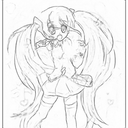

color


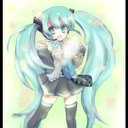

sketch


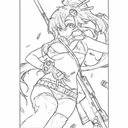

color


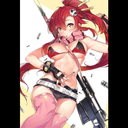

sketch


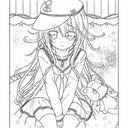

color


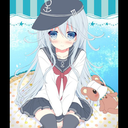

sketch


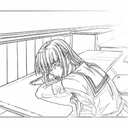

color


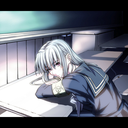

sketch


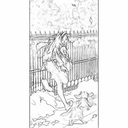

color


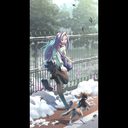

sketch


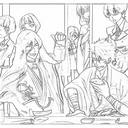

color


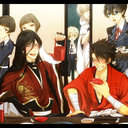

sketch


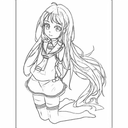

color


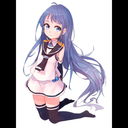

sketch


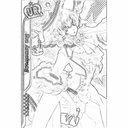

color


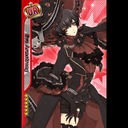

sketch


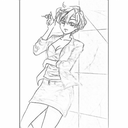

color


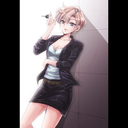

sketch


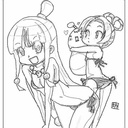

color


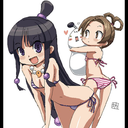

In [14]:
#Print some sample of images.

img_arr = [] #Array to store sketches.
col_arr = [] #Array to store color images.

n_samples = 10 #Number of sample want to be printed.

#Batch pointers
train_batch_pointer = 0
val_batch_pointer = 0

#Generate batch of skecth and corresponding color images.
img_arr, col_arr = generate_train_batch(img_tr, n_samples)

#Print generated images.
for i in range(10):
  print('sketch')
  #Convertng the generated image back to 0-255 value format.
  img = ((img_arr[i]+ 1)/2.0)*255.0
  #Converting back to BGR format required by cv2 library.
  img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
  #Show image
  cv2_imshow(img)

  print('color')
  #Convertng the generated image back to 0-255 value format.
  img = ((col_arr[i]+ 1)/2.0)*255.0
  #Converting back to BGR format required by cv2 library.
  img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)  
  #Show image
  cv2_imshow(img)


**4. U-Net Model to minimize Mean Absolute Error at Pixel Level**

**U-Net model**

The U-Net model architecture is very similar to encoder decoder model that it involves downsampling to a bottleneck and upsampling again to an output image, but links or skip-connections are made between layers of the same size in the encoder and the decoder, allowing the bottleneck to be circumvented.

Reference - https://machinelearningmastery.com/a-gentle-introduction-to-pix2pix-generative-adversarial-network/

In [15]:
#Defining a Random Gaussian variable to initialize weight for Conv layers.
from keras.initializers import RandomNormal
init = RandomNormal(stddev=0.02)

In [ ]:
#Function to generate U-net Model.
#Most of the papers suggested GAN model to generate images. But before jumping directly 
#to a complex GAN Model, I tried using simply Generator module to generate images 
#improving Pixelwise crossentropy loss.
#For the Generator Architecture referred - https://github.com/kvfrans/deepcolor/blob/master/main.py.
#The Code above was in tensor-flow. So, changed that to a Keras model.
#Also, left the learning paramters as default value, so that model learns faster.

def color_image():

    #Encoder Unit
    #Input Layer (128, 128, 3)
    encoder_input = Input(shape=(128, 128, 3,)) 
    #Layer-1 Output image of shape - 64 * 64 * 64
    encoder_output_1 = Conv2D(64, (5,5), padding='same',  strides=2, kernel_initializer=init)(encoder_input) 
    #Leaky ReLUs allow a small, non-zero gradient when the unit is not active. 
    encoder_output_2 = LeakyReLU(alpha=0.2)(encoder_output_1)  
    #Layer-2 Output image of shape - 32 * 32 * 128
    encoder_output_2 = Conv2D(128, (5,5),  padding='same', strides=2, kernel_initializer=init)(encoder_output_2)
    #Batch Normalization.
    encoder_output_2 = BatchNormalization(momentum=0.9)(encoder_output_2)
    #Layer-3 Output image of shape - 16 * 16 * 256
    encoder_output_3 = LeakyReLU(alpha=0.2)(encoder_output_2)
    encoder_output_3 = Conv2D(256, (5,5),  padding='same',  strides=2, kernel_initializer=init)(encoder_output_3)
    encoder_output_3 = BatchNormalization(momentum=0.9)(encoder_output_3)
    #Layer-4 Output image of shape - 8 * 8 * 512
    encoder_output_4 = LeakyReLU(alpha=0.2)(encoder_output_3)
    encoder_output_4 = Conv2D(512, (5,5),  padding='same',  strides=2, kernel_initializer=init)(encoder_output_4)
    encoder_output_4 = BatchNormalization(momentum=0.9)(encoder_output_4)
    #Layer-5 Output image of shape - 4 * 4 * 512
    encoder_output_5 = LeakyReLU(alpha=0.2)(encoder_output_4)
    encoder_output_5 = Conv2D(512, (5,5),  padding='same',  strides=2, kernel_initializer=init)(encoder_output_5)
    encoder_output_5 = BatchNormalization(momentum=0.9)(encoder_output_5)
    

    
    #Decoder Unit
    #Conv2DTranspose - The need for transposed convolutions generally arises from the desire to use a transformation going in the opposite 
    #direction of a normal convolution, i.e., from something that has the shape of the output of some convolution to 
    #something that has the shape of its input while maintaining a connectivity pattern that is compatible with said convolution.
    #Ref- https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2DTranspose
    #Layer-6 Output image of shape - 8 * 8 * 512
    encoder_output_6 = Conv2DTranspose(512, (5,5), padding='same', activation='relu', strides=2, kernel_initializer=init)(encoder_output_5)
    encoder_output_6  = BatchNormalization(momentum=0.9)(encoder_output_6)
    #Concatenating output from previous layer with output from layer-4. Both are of same dimension.
    encoder_output_6 = Add()([encoder_output_6, encoder_output_4])
    #Layer-7 Output image of shape - 16 * 16 * 256
    encoder_output_7 = Conv2DTranspose(256, (5,5), padding='same', activation='relu', strides=2, kernel_initializer=init)(encoder_output_6)
    encoder_output_7  = BatchNormalization(momentum=0.9)(encoder_output_7)
    #Concatenating output from previous layer with output from layer-3. Both are of same dimension.
    encoder_output_7 = Add()([encoder_output_7, encoder_output_3])
    #Layer-8 Output image of shape - 32 * 32 * 128
    encoder_output_8 = Conv2DTranspose(128, (5,5), padding='same', activation='relu', strides=2, kernel_initializer=init)(encoder_output_7)
    encoder_output_8  = BatchNormalization(momentum=0.9)(encoder_output_8)
    #Concatenating output from previous layer with output from layer-2. Both are of same dimension.
    encoder_output_8 = Add()([encoder_output_8, encoder_output_2]) 
    #Layer-9 Output image of shape - 64 * 64 * 64
    encoder_output_9 = Conv2DTranspose(64, (5,5), padding='same', activation='relu', strides=2, kernel_initializer=init)(encoder_output_8)
    encoder_output_9  = BatchNormalization(momentum=0.9)(encoder_output_9)
    #Concatenating output from previous layer with output from layer-1. Both are of same dimension
    encoder_output_9 = Add()([encoder_output_9, encoder_output_1]) 
    #Layer-10 (Output Layer) Output image of shape - 128 * 128 * 3
    encoder_output = Conv2DTranspose(3, (5,5), padding='same', activation='tanh', strides=2, kernel_initializer=init)(encoder_output_9)
    
    #Defining Model with input and Outputs.
    model = Model(encoder_input, encoder_output)

    #Adam Optimizer.
    opt = Adam(lr=0.0002, beta_1=0.5)  
    
    #Compile Model with Adam Optimizer and Mean Absolute Error.
    model.compile(optimizer=opt, loss=['mae'])
    #Return Model.
    return model

In [ ]:
#Calling the U-net model eefined above and print its summary.
model = color_image()
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 64, 64, 64)   4864        ['input_1[0][0]']                
                                                                                                  
 leaky_re_lu (LeakyReLU)        (None, 64, 64, 64)   0           ['conv2d[0][0]']                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 32, 32, 128)  204928      ['leaky_re_lu[0][0]']        

In [ ]:
#Plot model performance.
def plot_history(tr_loss, val_loss):
# plot Loss
 pyplot.plot(tr_loss, "-g",  label='Training Loss')
 pyplot.plot(val_loss, "-r",  label='Validation Loss')
 pyplot.gca().set_title("Loss Curve")
 pyplot.legend(loc="upper right")
 pyplot.show()

In [ ]:
#Show generated images.

n_samples = 3 #Number of sample want to be printed.

#Resetting pointers to zero.
train_batch_pointer = 0
val_batch_pointer = 0

#Generate batch of skecth and corresponding color images.
X_tr, Y_tr = generate_train_batch(img_tr, n_samples)

#Generate batch of skecth and corresponding color images.
X_val, Y_val = generate_val_batch(img_val, n_samples)

#Resetting pointers to zero.
train_batch_pointer = 0
val_batch_pointer = 0

#Function to print generated images from train model using train and validation data.
def summarize_performance(model):

  #Generate image on samples from train data.
  gen_arr = model.predict(X_tr)

  #Print image on 2 samples from train data.
  for i in range(2):
    print('Train data : sketch image')
    #Convertng the generated image back to 0-255 value format.
    img = ((X_tr[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)

    print('Train data : color image')
    #Convertng the generated image back to 0-255 value format.
    img = ((Y_tr[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)

    print('Train data : Generated image')
    #Convertng the generated image back to 0-255 value format.
    img = ((gen_arr[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
  
  #Generate image on samples from validation data.
  gen_arr = model.predict(X_val)

  #Print image on 2 samples from validation data.
  for i in range(3):
    print('Validation data : sketch image')
    #Convertng the generated image back to 0-255 value format.
    img = ((X_val[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)

    print('Validation data : color image')
    #Convertng the generated image back to 0-255 value format.
    img = ((Y_val[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)

    print('Validation data : Generated image')
    #Convertng the generated image back to 0-255 value format.
    img = ((gen_arr[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)

In [ ]:
#Resetting pointers.
train_batch_pointer = 0
val_batch_pointer = 0

In [ ]:
#Print pointer values.
print('train batch pointer',train_batch_pointer ) 
print('val batch pointer',val_batch_pointer ) 

train batch pointer 0
val batch pointer 0


In [ ]:
#Train the model to generate images.

epochs = 100    #Number of epochs.
batch_size = 128 #Batch Size.

#Length of train dataset.
len_tr = len(img_tr) 

#List to store results.
tr_loss_hist, val_loss_hist = list(), list()

#Calling initial model to generate images
model = color_image()

#Timer
start_time = datetime.now()

#Training for number of epochs.
for e in range(epochs):

  #Looping for number of iterations so that all images gets processed atleast once in epoch.
  for i in range(int(len_tr/batch_size)):
  
    #Generate batch of train data.
    xs, ys = generate_train_batch(img_tr, batch_size)
   
    #Train model on batch of data generated above.   
    tr_loss = model.train_on_batch(xs,ys)

    #Generate batch of validation data.
    xs, ys = generate_val_batch(img_val, batch_size)

    #Test model on validation data
    val_loss = model.test_on_batch(xs,ys)    

    #Append performances.
    tr_loss_hist.append(tr_loss)
    val_loss_hist.append(val_loss)
  
  #Print results after every 25 epoch.
  if e == 1 or e % 25 == 0 or e% (epochs-1) == 0:
     print('Iteration number:',e)   
     elapsed_time = datetime.now() - start_time
     print('Elapsed Time:', elapsed_time)
     print('Training Loss:',tr_loss)
     print('Validation Loss:',val_loss) 
     if  (e % 25 == 0 or e% (epochs-1) == 0) and (e != 0):
         plot_history(tr_loss_hist, val_loss_hist) 
         #Saving the model.
         model.save_weights('model_' + str(e) + '.h5')
         print("Saved model to disk")
     #Generating images using model trained.    
     summarize_performance(model)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
#Train the model to generate images.

epochs = 50    #Number of epochs.
batch_size = 64 #Batch Size.

#Length of train dataset.
len_tr = len(img_tr) 

#List to store results.
tr_loss_hist, val_loss_hist = list(), list()

#Calling initial model to generate images
model = color_image()

#Timer
start_time = datetime.now()

#Training for number of epochs.
for e in range(epochs):

  #Looping for number of iterations so that all images gets processed atleast once in epoch.
  for i in range(int(len_tr/batch_size)):
  
    #Generate batch of train data.
    xs, ys = generate_train_batch(img_tr, batch_size)
   
    #Train model on batch of data generated above.   
    tr_loss = model.train_on_batch(xs,ys)

    #Generate batch of validation data.
    xs, ys = generate_val_batch(img_val, batch_size)

    #Test model on validation data
    val_loss = model.test_on_batch(xs,ys)    

    #Append performances.
    tr_loss_hist.append(tr_loss)
    val_loss_hist.append(val_loss)
  
  #Print results after every 25 epoch.
  if e == 1 or e % 10 == 0 or e% (epochs-1) == 0:
     print('Iteration number:',e)   
     elapsed_time = datetime.now() - start_time
     print('Elapsed Time:', elapsed_time)
     print('Training Loss:',tr_loss)
     print('Validation Loss:',val_loss) 
     if  (e % 10 == 0 or e% (epochs-1) == 0) and (e != 0):
         plot_history(tr_loss_hist, val_loss_hist) 
         #Saving the model.
         model.save_weights('model_' + str(e) + '.h5')
         print("Saved model to disk")
     #Generating images using model trained.    
     summarize_performance(model)

Output hidden; open in https://colab.research.google.com to view.



Iteration number: 0
Elapsed Time: 0:01:28.931124
Training Loss: 0.33094025
Validation Loss: 0.9065281
Train data : sketch image


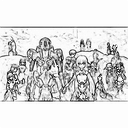

Train data : color image


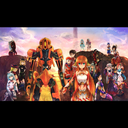

Train data : Generated image


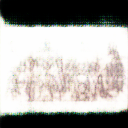

Train data : sketch image


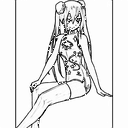

Train data : color image


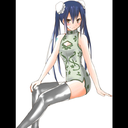

Train data : Generated image


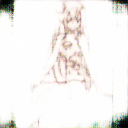

Validation data : sketch image


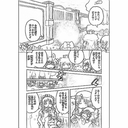

Validation data : color image


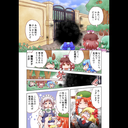

Validation data : Generated image


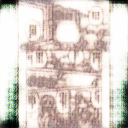

Validation data : sketch image


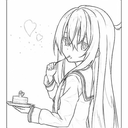

Validation data : color image


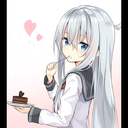

Validation data : Generated image


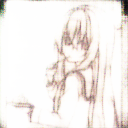

Iteration number: 1
Elapsed Time: 0:02:35.543473
Training Loss: 0.3238971
Validation Loss: 0.78196377
Train data : sketch image


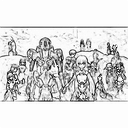

Train data : color image


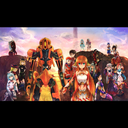

Train data : Generated image


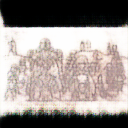

Train data : sketch image


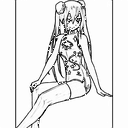

Train data : color image


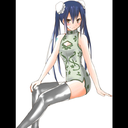

Train data : Generated image


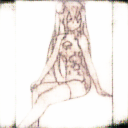

Validation data : sketch image


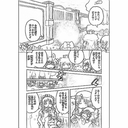

Validation data : color image


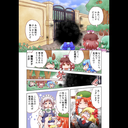

Validation data : Generated image


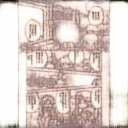

Validation data : sketch image


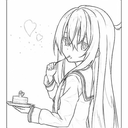

Validation data : color image


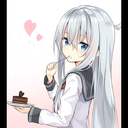

Validation data : Generated image


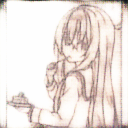

Iteration number: 25
Elapsed Time: 0:29:13.298577
Training Loss: 0.14635395
Validation Loss: 0.33072388


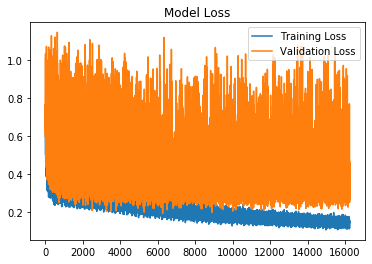

Saved model to disk
Train data : sketch image


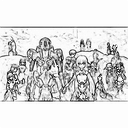

Train data : color image


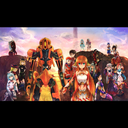

Train data : Generated image


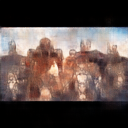

Train data : sketch image


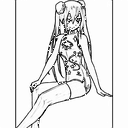

Train data : color image


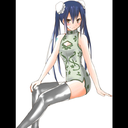

Train data : Generated image


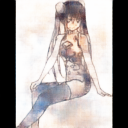

Validation data : sketch image


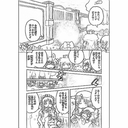

Validation data : color image


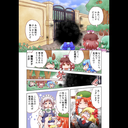

Validation data : Generated image


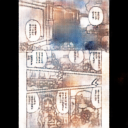

Validation data : sketch image


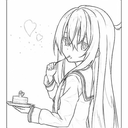

Validation data : color image


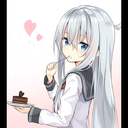

Validation data : Generated image


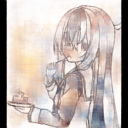

Iteration number: 50
Elapsed Time: 0:56:46.283170
Training Loss: 0.112648904
Validation Loss: 0.33258596


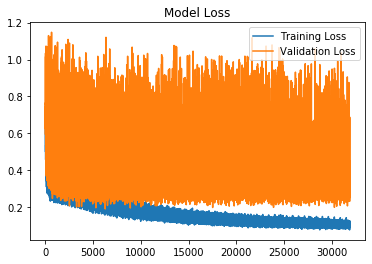

Saved model to disk
Train data : sketch image


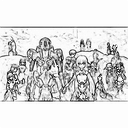

Train data : color image


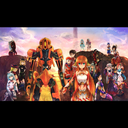

Train data : Generated image


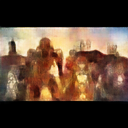

Train data : sketch image


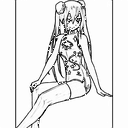

Train data : color image


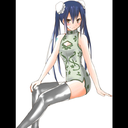

Train data : Generated image


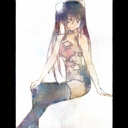

Validation data : sketch image


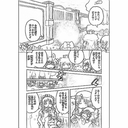

Validation data : color image


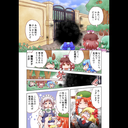

Validation data : Generated image


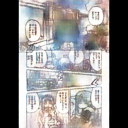

Validation data : sketch image


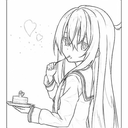

Validation data : color image


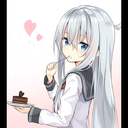

Validation data : Generated image


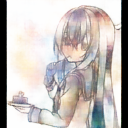

Iteration number: 75
Elapsed Time: 1:24:17.061230
Training Loss: 0.09615681
Validation Loss: 0.3271768


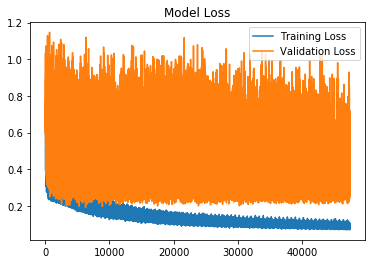

Saved model to disk
Train data : sketch image


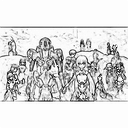

Train data : color image


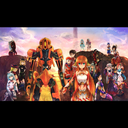

Train data : Generated image


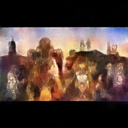

Train data : sketch image


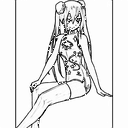

Train data : color image


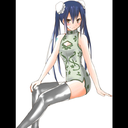

Train data : Generated image


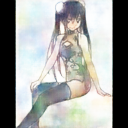

Validation data : sketch image


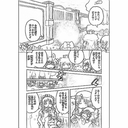

Validation data : color image


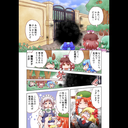

Validation data : Generated image


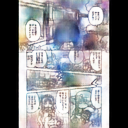

Validation data : sketch image


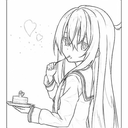

Validation data : color image


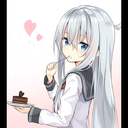

Validation data : Generated image


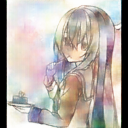

Iteration number: 100
Elapsed Time: 1:51:54.996469
Training Loss: 0.084380314
Validation Loss: 0.32648998


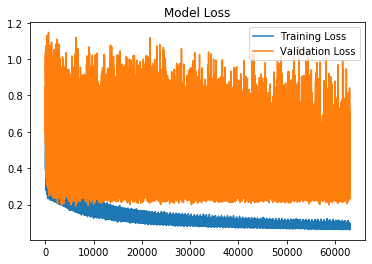

Saved model to disk
Train data : sketch image


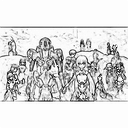

Train data : color image


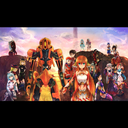

Train data : Generated image


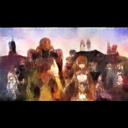

Train data : sketch image


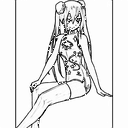

Train data : color image


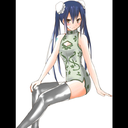

Train data : Generated image


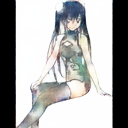

Validation data : sketch image


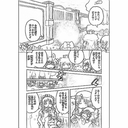

Validation data : color image


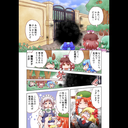

Validation data : Generated image


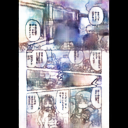

Validation data : sketch image


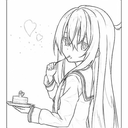

Validation data : color image


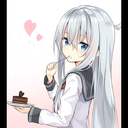

Validation data : Generated image


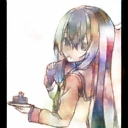

Iteration number: 125
Elapsed Time: 2:19:27.012384
Training Loss: 0.071632236
Validation Loss: 0.38078955


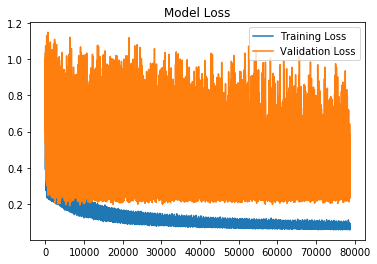

Saved model to disk
Train data : sketch image


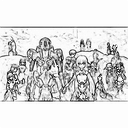

Train data : color image


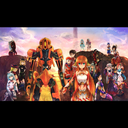

Train data : Generated image


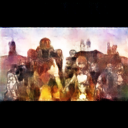

Train data : sketch image


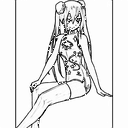

Train data : color image


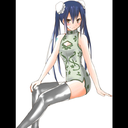

Train data : Generated image


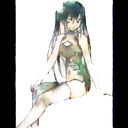

Validation data : sketch image


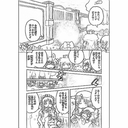

Validation data : color image


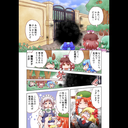

Validation data : Generated image


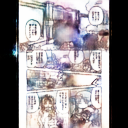

Validation data : sketch image


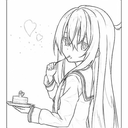

Validation data : color image


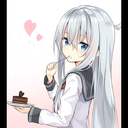

Validation data : Generated image


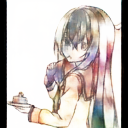

Iteration number: 150
Elapsed Time: 2:46:44.283300
Training Loss: 0.06780927
Validation Loss: 0.58329815


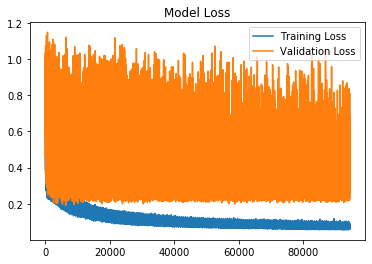

Saved model to disk
Train data : sketch image


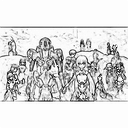

Train data : color image


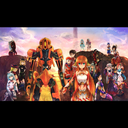

Train data : Generated image


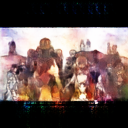

Train data : sketch image


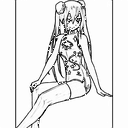

Train data : color image


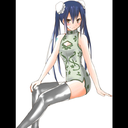

Train data : Generated image


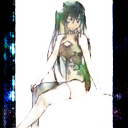

Validation data : sketch image


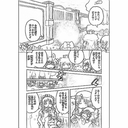

Validation data : color image


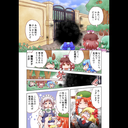

Validation data : Generated image


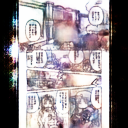

Validation data : sketch image


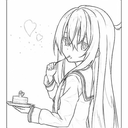

Validation data : color image


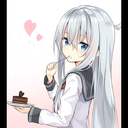

Validation data : Generated image


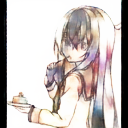

Iteration number: 175
Elapsed Time: 3:13:50.540281
Training Loss: 0.06506091
Validation Loss: 0.32264924


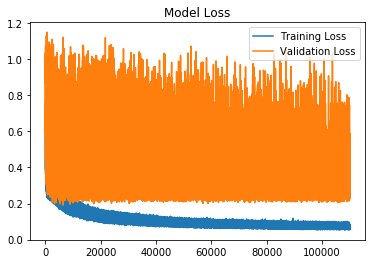

Saved model to disk
Train data : sketch image


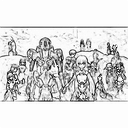

Train data : color image


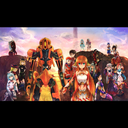

Train data : Generated image


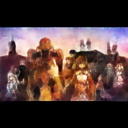

Train data : sketch image


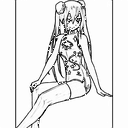

Train data : color image


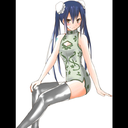

Train data : Generated image


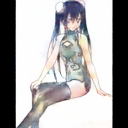

Validation data : sketch image


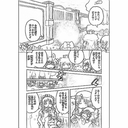

Validation data : color image


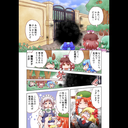

Validation data : Generated image


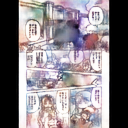

Validation data : sketch image


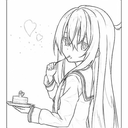

Validation data : color image


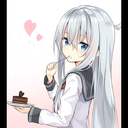

Validation data : Generated image


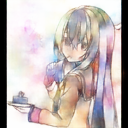

Iteration number: 200
Elapsed Time: 3:41:15.703335
Training Loss: 0.061432272
Validation Loss: 0.31426767


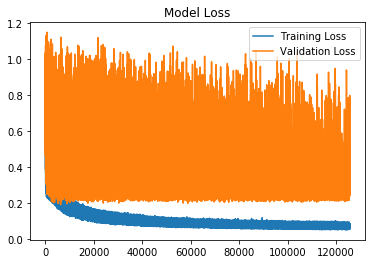

Saved model to disk
Train data : sketch image


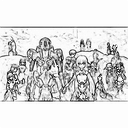

Train data : color image


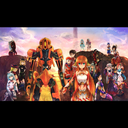

Train data : Generated image


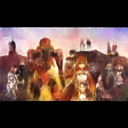

Train data : sketch image


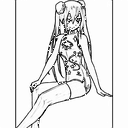

Train data : color image


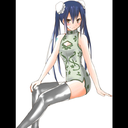

Train data : Generated image


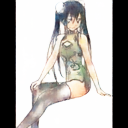

Validation data : sketch image


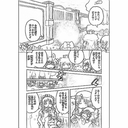

Validation data : color image


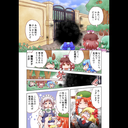

Validation data : Generated image


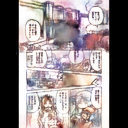

Validation data : sketch image


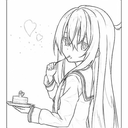

Validation data : color image


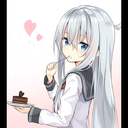

Validation data : Generated image


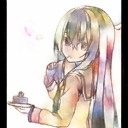

Iteration number: 225
Elapsed Time: 4:08:43.068401
Training Loss: 0.06559834
Validation Loss: 0.34573698


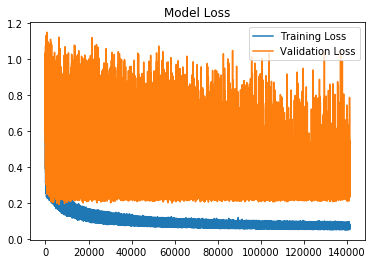

Saved model to disk
Train data : sketch image


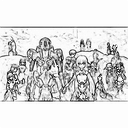

Train data : color image


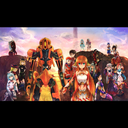

Train data : Generated image


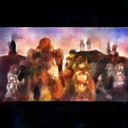

Train data : sketch image


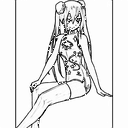

Train data : color image


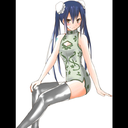

Train data : Generated image


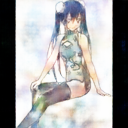

Validation data : sketch image


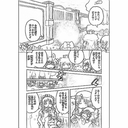

Validation data : color image


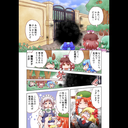

Validation data : Generated image


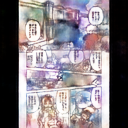

Validation data : sketch image


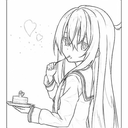

Validation data : color image


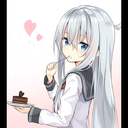

Validation data : Generated image


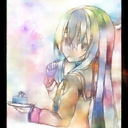

Iteration number: 250
Elapsed Time: 4:36:08.769323
Training Loss: 0.059964336
Validation Loss: 0.32558033


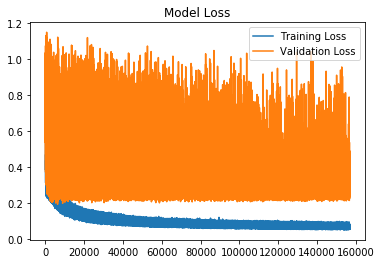

Saved model to disk
Train data : sketch image


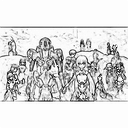

Train data : color image


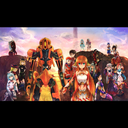

Train data : Generated image


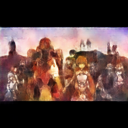

Train data : sketch image


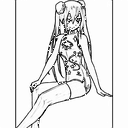

Train data : color image


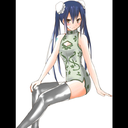

Train data : Generated image


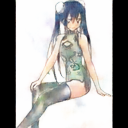

Validation data : sketch image


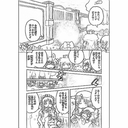

Validation data : color image


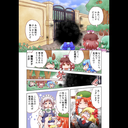

Validation data : Generated image


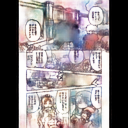

Validation data : sketch image


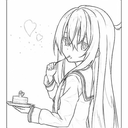

Validation data : color image


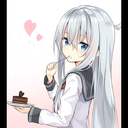

Validation data : Generated image


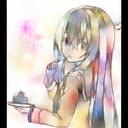

Iteration number: 275
Elapsed Time: 5:03:28.030125
Training Loss: 0.05880596
Validation Loss: 0.35771853


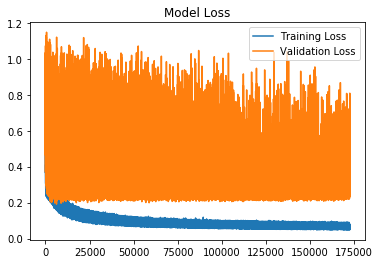

Saved model to disk
Train data : sketch image


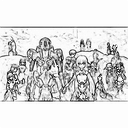

Train data : color image


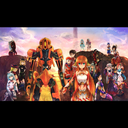

Train data : Generated image


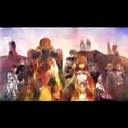

Train data : sketch image


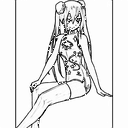

Train data : color image


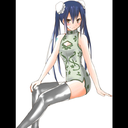

Train data : Generated image


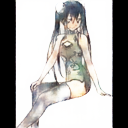

Validation data : sketch image


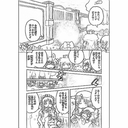

Validation data : color image


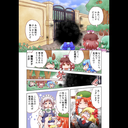

Validation data : Generated image


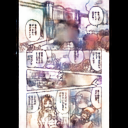

Validation data : sketch image


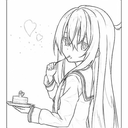

Validation data : color image


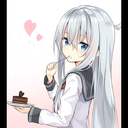

Validation data : Generated image


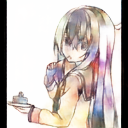

In [ ]:
#Train the model to generate images.

epochs = 100    #Number of epochs.
batch_size = 16 #Batch Size.

#Length of train dataset.
len_tr = len(img_tr) 

#List to store results.
tr_loss_hist, val_loss_hist = list(), list()

#Calling initial model to generate images
model = color_image()

#Timer
start_time = datetime.now()

#Training for number of epochs.
for e in range(epochs):

  #Looping for number of iterations so that all images gets processed atleast once in epoch.
  for i in range(int(len_tr/batch_size)):
  
    #Generate batch of train data.
    xs, ys = generate_train_batch(img_tr, batch_size)
   
    #Train model on batch of data generated above.   
    tr_loss = model.train_on_batch(xs,ys)

    #Generate batch of validation data.
    xs, ys = generate_val_batch(img_val, batch_size)

    #Test model on validation data
    val_loss = model.test_on_batch(xs,ys)    

    #Append performances.
    tr_loss_hist.append(tr_loss)
    val_loss_hist.append(val_loss)
  
  #Print results after every 25 epoch.
  if e == 1 or e % 25 == 0 or e% (epochs-1) == 0:
     print('Iteration number:',e)   
     elapsed_time = datetime.now() - start_time
     print('Elapsed Time:', elapsed_time)
     print('Training Loss:',tr_loss)
     print('Validation Loss:',val_loss) 
     if  (e % 25 == 0 or e% (epochs-1) == 0) and (e != 0):
         plot_history(tr_loss_hist, val_loss_hist) 
         #Saving the model.
         model.save_weights('model_' + str(e) + '.h5')
         print("Saved model to disk")
     #Generating images using model trained.    
     summarize_performance(model)

Iteration number: 0
Elapsed Time: 0:01:13.985516
Training Loss: 0.096800715
Validation Loss: 0.3363504
Train data : sketch image


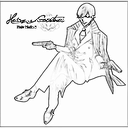

Train data : color image


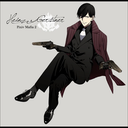

Train data : Generated image


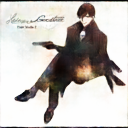

Train data : sketch image


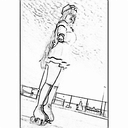

Train data : color image


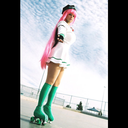

Train data : Generated image


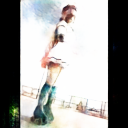

Validation data : sketch image


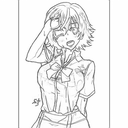

Validation data : color image


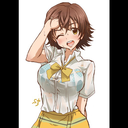

Validation data : Generated image


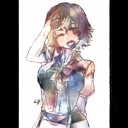

Validation data : sketch image


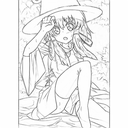

Validation data : color image


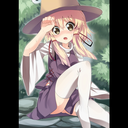

Validation data : Generated image


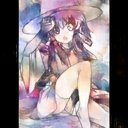

Iteration number: 1
Elapsed Time: 0:02:24.422692
Training Loss: 0.0846717
Validation Loss: 0.29520547
Train data : sketch image


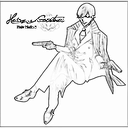

Train data : color image


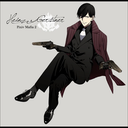

Train data : Generated image


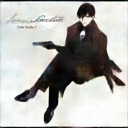

Train data : sketch image


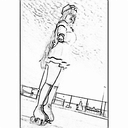

Train data : color image


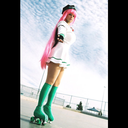

Train data : Generated image


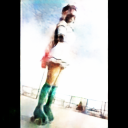

Validation data : sketch image


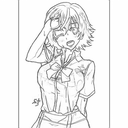

Validation data : color image


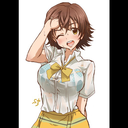

Validation data : Generated image


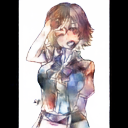

Validation data : sketch image


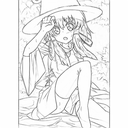

Validation data : color image


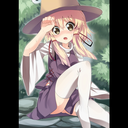

Validation data : Generated image


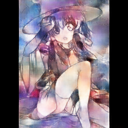

Iteration number: 25
Elapsed Time: 0:30:39.285143
Training Loss: 0.07896449
Validation Loss: 0.27792794


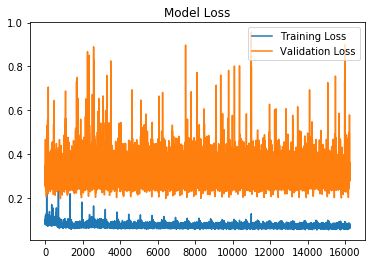

Saved model to disk
Train data : sketch image


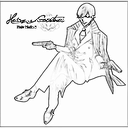

Train data : color image


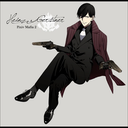

Train data : Generated image


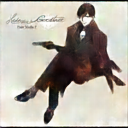

Train data : sketch image


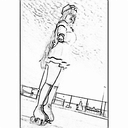

Train data : color image


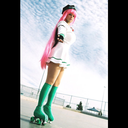

Train data : Generated image


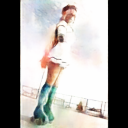

Validation data : sketch image


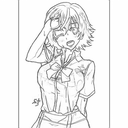

Validation data : color image


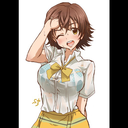

Validation data : Generated image


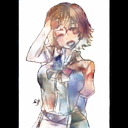

Validation data : sketch image


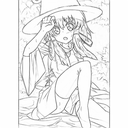

Validation data : color image


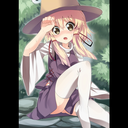

Validation data : Generated image


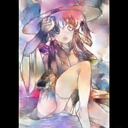

Iteration number: 50
Elapsed Time: 0:59:54.335104
Training Loss: 0.07416828
Validation Loss: 0.38107044


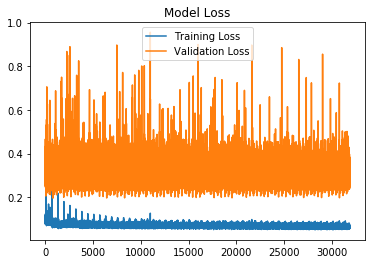

Saved model to disk
Train data : sketch image


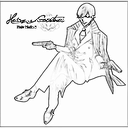

Train data : color image


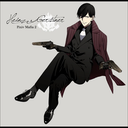

Train data : Generated image


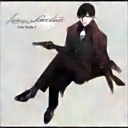

Train data : sketch image


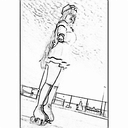

Train data : color image


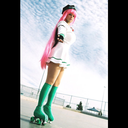

Train data : Generated image


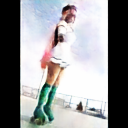

Validation data : sketch image


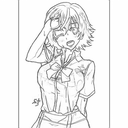

Validation data : color image


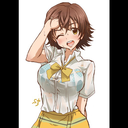

Validation data : Generated image


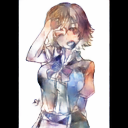

Validation data : sketch image


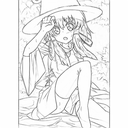

Validation data : color image


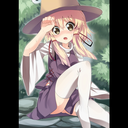

Validation data : Generated image


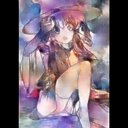

Iteration number: 75
Elapsed Time: 1:28:58.912072
Training Loss: 0.071116194
Validation Loss: 0.3180862


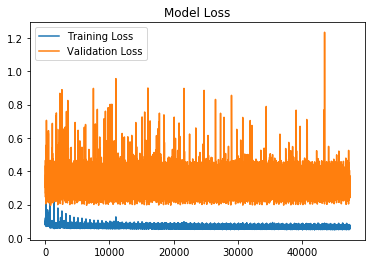

Saved model to disk
Train data : sketch image


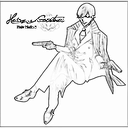

Train data : color image


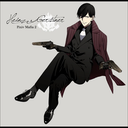

Train data : Generated image


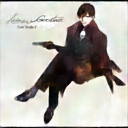

Train data : sketch image


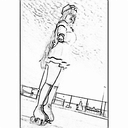

Train data : color image


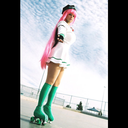

Train data : Generated image


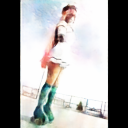

Validation data : sketch image


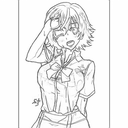

Validation data : color image


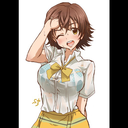

Validation data : Generated image


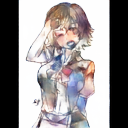

Validation data : sketch image


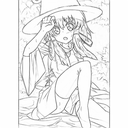

Validation data : color image


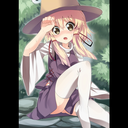

Validation data : Generated image


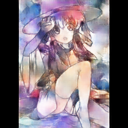

Iteration number: 100
Elapsed Time: 1:58:09.464617
Training Loss: 0.07309148
Validation Loss: 0.34585816


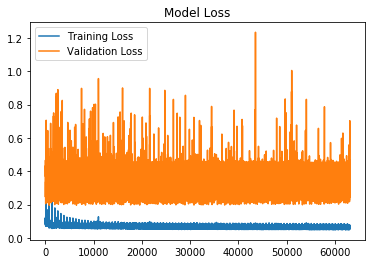

Saved model to disk
Train data : sketch image


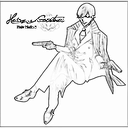

Train data : color image


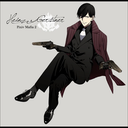

Train data : Generated image


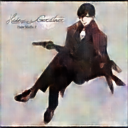

Train data : sketch image


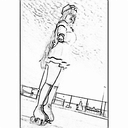

Train data : color image


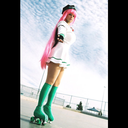

Train data : Generated image


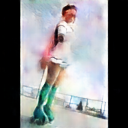

Validation data : sketch image


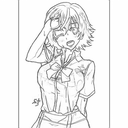

Validation data : color image


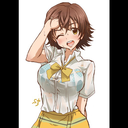

Validation data : Generated image


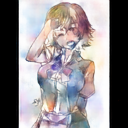

Validation data : sketch image


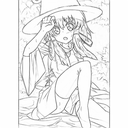

Validation data : color image


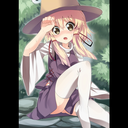

Validation data : Generated image


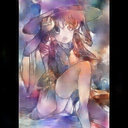

Iteration number: 125
Elapsed Time: 2:26:50.032332
Training Loss: 0.068257555
Validation Loss: 0.37269935


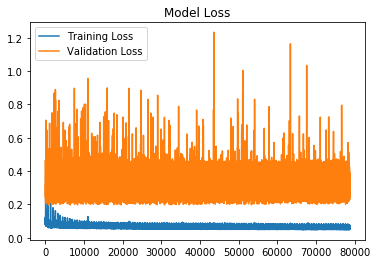

Saved model to disk
Train data : sketch image


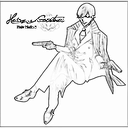

Train data : color image


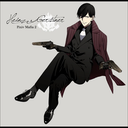

Train data : Generated image


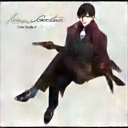

Train data : sketch image


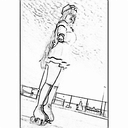

Train data : color image


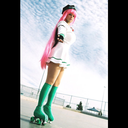

Train data : Generated image


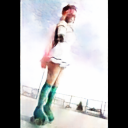

Validation data : sketch image


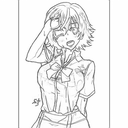

Validation data : color image


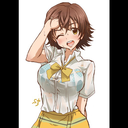

Validation data : Generated image


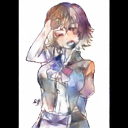

Validation data : sketch image


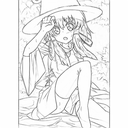

Validation data : color image


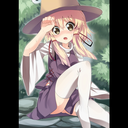

Validation data : Generated image


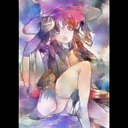

Iteration number: 149
Elapsed Time: 2:54:54.026871
Training Loss: 0.06702909
Validation Loss: 0.38155878


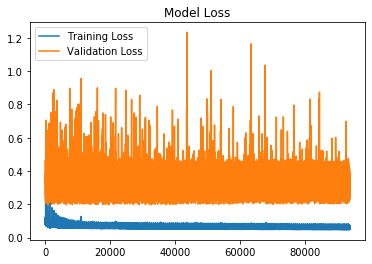

Saved model to disk
Train data : sketch image


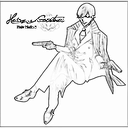

Train data : color image


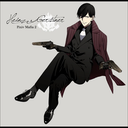

Train data : Generated image


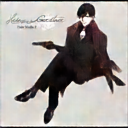

Train data : sketch image


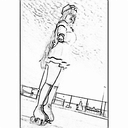

Train data : color image


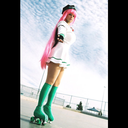

Train data : Generated image


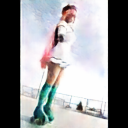

Validation data : sketch image


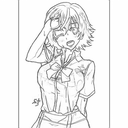

Validation data : color image


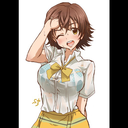

Validation data : Generated image


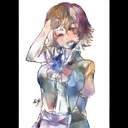

Validation data : sketch image


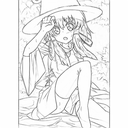

Validation data : color image


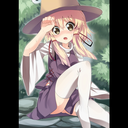

Validation data : Generated image


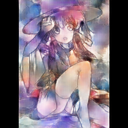

In [ ]:
#Training for 150 more epochs.
epochs = 150
batch_size = 16

#Number of images in train set
len_tr = len(img_tr) 

#List to store results.
tr_loss_hist, val_loss_hist = list(), list()

#Generating model
model = color_image()

#Loading weights from model trained above.
model.load_weights('model_225.h5')

#Timer
start_time = datetime.now()

#Training for number of epochs.
for e in range(epochs):
  #Looping for number of iterations so that all images gets processed atleast once in epoch.
  for i in range(int(len_tr/batch_size)):
    #Generate batch of images from train set.
    xs, ys = generate_train_batch(img_tr, batch_size)
   
    #Train model on above data. 
    tr_loss = model.train_on_batch(xs,ys)

    #Generate batch of images from validation set.
    xs, ys = generate_val_batch(img_val, batch_size)

    #Test model on above data. 
    val_loss = model.test_on_batch(xs,ys)    

    #Append performances.
    tr_loss_hist.append(tr_loss)
    val_loss_hist.append(val_loss)
 
  #Show results after each 25 epochs.
  if e == 1 or e % 25 == 0 or e% (epochs-1) == 0:
     print('Iteration number:',e)   
     elapsed_time = datetime.now() - start_time
     print('Elapsed Time:', elapsed_time)
     print('Training Loss:',tr_loss)
     print('Validation Loss:',val_loss) 
     if  (e % 25 == 0 or e% (epochs-1) == 0) and (e != 0):
         #Plot results.
         plot_history(tr_loss_hist, val_loss_hist) 
         #Saving the model.
         model.save_weights('model_' + str(e) + '.h5')
         print("Saved model to disk")
     #Generate images using model trained.    
     summarize_performance(model)

In [ ]:
#Loading weights from best trained model above.
model = color_image()
model.load_weights('model_200(1).h5')

In [ ]:
#Show generated images.

n_samples = 10 #Number of sample want to be printed.


#Resetting pointers to zero.
train_batch_pointer = 0
val_batch_pointer = 0

#Generate batch of skecth and corresponding color images.
X_tr, Y_tr = generate_train_batch(img_tr, n_samples)

#Generate batch of skecth and corresponding color images.
X_val, Y_val = generate_val_batch(img_val, n_samples)

val_batch_pointer = 0

#Generate batch of skecth and corresponding color images.
X_ts, Y_ts = generate_val_batch(img_tst, n_samples)


#Resetting pointers to zero.
train_batch_pointer = 0
val_batch_pointer = 0


#Function to generate 10 generated image from each train, validation and test data.
def print_results(model):
  
  #Generate image on 10 samples from train data.
  gen_arr = model.predict(X_tr)

  for i in range(10):
    print('Train data : sketch image')
    #Convertng the generated image back to 0-255 value format.
    img = ((X_tr[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)

    print('Train data : color image')
    #Convertng the generated image back to 0-255 value format.
    img = ((Y_tr[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)

    print('Train data : Generated image')
    #Convertng the generated image back to 0-255 value format.
    img = ((gen_arr[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
  
  #Generate image on 10 samples from validation data.
  gen_arr = model.predict(X_val)

  for i in range(10):
    print('Validation data : sketch image')
    #Convertng the generated image back to 0-255 value format.
    img = ((X_val[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)

    print('Validation data : color image')
    #Convertng the generated image back to 0-255 value format.
    img = ((Y_val[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)

    print('Validation data : Generated image')
    #Convertng the generated image back to 0-255 value format.
    img = ((gen_arr[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)

  #Generate image on 10 samples from test data.
  gen_arr = model.predict(X_ts)
  
  for i in range(10):
    print('Test data : sketch image')
    #Convertng the generated image back to 0-255 value format.
    img = ((X_ts[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)

    print('Test data : color image')
    #Convertng the generated image back to 0-255 value format.
    img = ((Y_ts[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)

    print('Test data : Generated image')
    #Convertng the generated image back to 0-255 value format.
    img = ((gen_arr[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)

Train data : sketch image


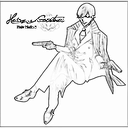

Train data : color image


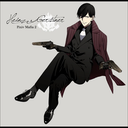

Train data : Generated image


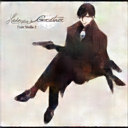

Train data : sketch image


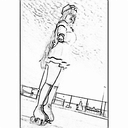

Train data : color image


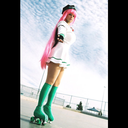

Train data : Generated image


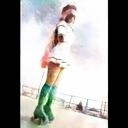

Train data : sketch image


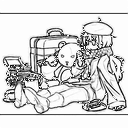

Train data : color image


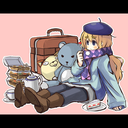

Train data : Generated image


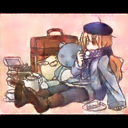

Train data : sketch image


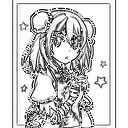

Train data : color image


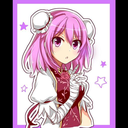

Train data : Generated image


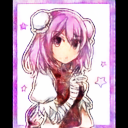

Train data : sketch image


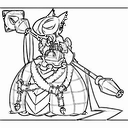

Train data : color image


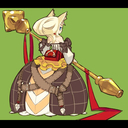

Train data : Generated image


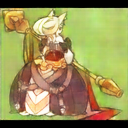

Train data : sketch image


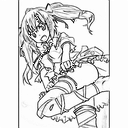

Train data : color image


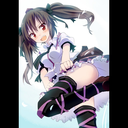

Train data : Generated image


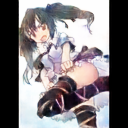

Train data : sketch image


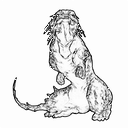

Train data : color image


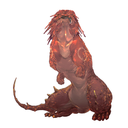

Train data : Generated image


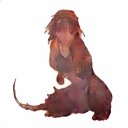

Train data : sketch image


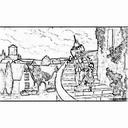

Train data : color image


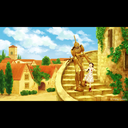

Train data : Generated image


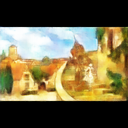

Train data : sketch image


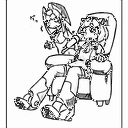

Train data : color image


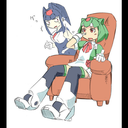

Train data : Generated image


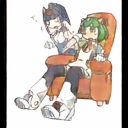

Train data : sketch image


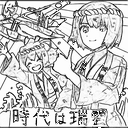

Train data : color image


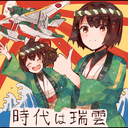

Train data : Generated image


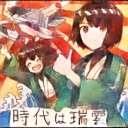

Validation data : sketch image


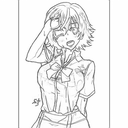

Validation data : color image


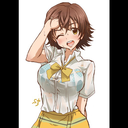

Validation data : Generated image


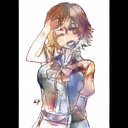

Validation data : sketch image


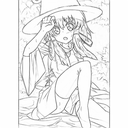

Validation data : color image


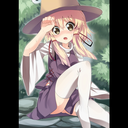

Validation data : Generated image


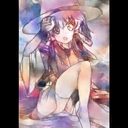

Validation data : sketch image


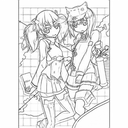

Validation data : color image


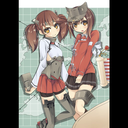

Validation data : Generated image


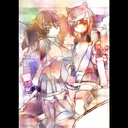

Validation data : sketch image


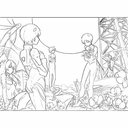

Validation data : color image


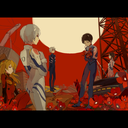

Validation data : Generated image


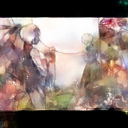

Validation data : sketch image


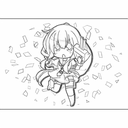

Validation data : color image


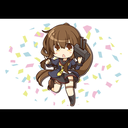

Validation data : Generated image


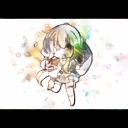

Validation data : sketch image


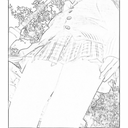

Validation data : color image


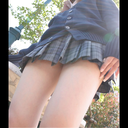

Validation data : Generated image


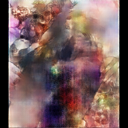

Validation data : sketch image


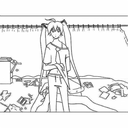

Validation data : color image


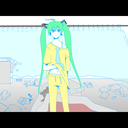

Validation data : Generated image


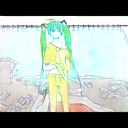

Validation data : sketch image


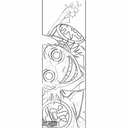

Validation data : color image


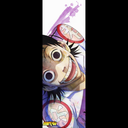

Validation data : Generated image


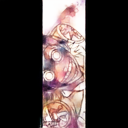

Validation data : sketch image


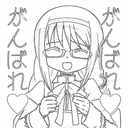

Validation data : color image


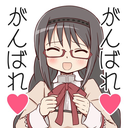

Validation data : Generated image


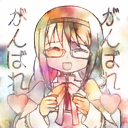

Validation data : sketch image


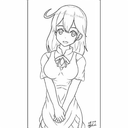

Validation data : color image


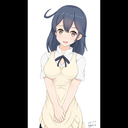

Validation data : Generated image


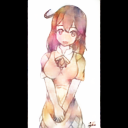

Test data : sketch image


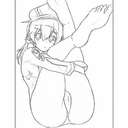

Test data : color image


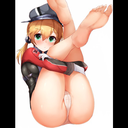

Test data : Generated image


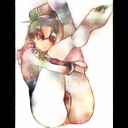

Test data : sketch image


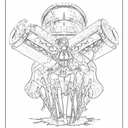

Test data : color image


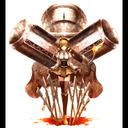

Test data : Generated image


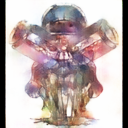

Test data : sketch image


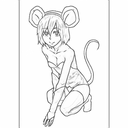

Test data : color image


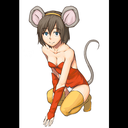

Test data : Generated image


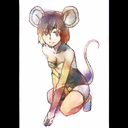

Test data : sketch image


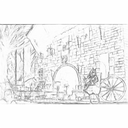

Test data : color image


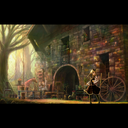

Test data : Generated image


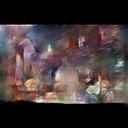

Test data : sketch image


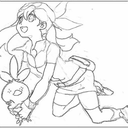

Test data : color image


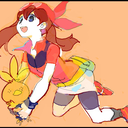

Test data : Generated image


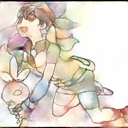

Test data : sketch image


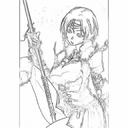

Test data : color image


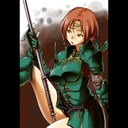

Test data : Generated image


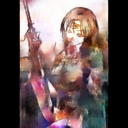

Test data : sketch image


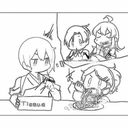

Test data : color image


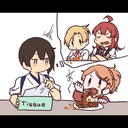

Test data : Generated image


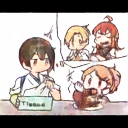

Test data : sketch image


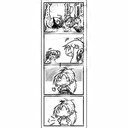

Test data : color image


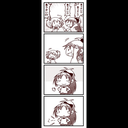

Test data : Generated image


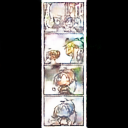

Test data : sketch image


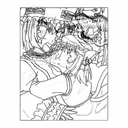

Test data : color image


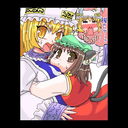

Test data : Generated image


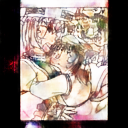

Test data : sketch image


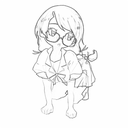

Test data : color image


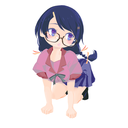

Test data : Generated image


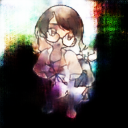

In [ ]:
#Generate images on some train, validation and test images using model trained above.
print_results(model)

**Observation -**

Model couldn't improve much on test data.

**5. GAN Model to generate Color Images**

In [104]:
#Defining a Random Gaussian variable to initialize weight for Conv layers.
from keras.initializers import RandomNormal
init = RandomNormal(stddev=0.02)

In [105]:
#Generator Model with U-net architecture.
#For the Generator Architecture referred - https://github.com/kvfrans/deepcolor/blob/master/main.py.
#The Code above was in tensor-flow. So, changed that to a Keras model.

def build_generator():

    #Encoder Unit
    #Input Layer (128, 128, 3)
    encoder_input = Input(shape=(128, 128, 3,))
    #Layer-1 Output image of shape - 64 * 64 * 64
    encoder_output_1 = Conv2D(64, (5,5), padding='same',  strides=2, kernel_initializer=init)(encoder_input)
    #Leaky ReLUs allow a small, non-zero gradient when the unit is not active. 
    encoder_output_2 = LeakyReLU(alpha=0.2)(encoder_output_1)
    #Layer-2 Output image of shape - 32 * 32 * 128
    encoder_output_2 = Conv2D(128, (5,5),  padding='same', strides=2, kernel_initializer=init)(encoder_output_2)
    #Batch Normalization.
    encoder_output_2 = BatchNormalization(momentum=0.9)(encoder_output_2)
    #Layer-3 Output image of shape - 16 * 16 * 256
    encoder_output_3 = LeakyReLU(alpha=0.2)(encoder_output_2)
    encoder_output_3 = Conv2D(256, (5,5),  padding='same',  strides=2, kernel_initializer=init)(encoder_output_3)
    encoder_output_3 = BatchNormalization(momentum=0.9)(encoder_output_3)
    #Layer-4 Output image of shape - 8 * 8 * 512
    encoder_output_4 = LeakyReLU(alpha=0.2)(encoder_output_3)
    encoder_output_4 = Conv2D(512, (5,5),  padding='same',  strides=2, kernel_initializer=init)(encoder_output_4)
    encoder_output_4 = BatchNormalization(momentum=0.9)(encoder_output_4)
    #Layer-5 Output image of shape - 4 * 4 * 512
    encoder_output_5 = LeakyReLU(alpha=0.2)(encoder_output_4)
    encoder_output_5 = Conv2D(512, (5,5),  padding='same',  strides=2, kernel_initializer=init)(encoder_output_5)
    encoder_output_5 = BatchNormalization(momentum=0.9)(encoder_output_5)
    

    
    #Decoder Unit
    #Conv2DTranspose - The need for transposed convolutions generally arises from the desire to use a transformation going in the opposite 
    #direction of a normal convolution, i.e., from something that has the shape of the output of some convolution to 
    #something that has the shape of its input while maintaining a connectivity pattern that is compatible with said convolution.
    #Ref- https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2DTranspose
    #Layer-6 Output image of shape - 8 * 8 * 512
    encoder_output_6 = Conv2DTranspose(512, (5,5), padding='same', activation='relu', strides=2, kernel_initializer=init )(encoder_output_5)
    encoder_output_6  = BatchNormalization(momentum=0.9)(encoder_output_6)
    #Concatenating output from previous layer with output from layer-4. Both are of same dimension.
    encoder_output_6 = Add()([encoder_output_6, encoder_output_4])
    #Layer-7 Output image of shape - 16 * 16 * 256
    encoder_output_7 = Conv2DTranspose(256, (5,5), padding='same', activation='relu', strides=2, kernel_initializer=init)(encoder_output_6)
    encoder_output_7  = BatchNormalization(momentum=0.9)(encoder_output_7)
    #Concatenating output from previous layer with output from layer-3. Both are of same dimension.
    encoder_output_7 = Add()([encoder_output_7, encoder_output_3])
    #Layer-8 Output image of shape - 32 * 32 * 128
    encoder_output_8 = Conv2DTranspose(128, (5,5), padding='same', activation='relu', strides=2, kernel_initializer=init)(encoder_output_7)
    encoder_output_8  = BatchNormalization(momentum=0.9)(encoder_output_8)
    #Concatenating output from previous layer with output from layer-2. Both are of same dimension.
    encoder_output_8 = Add()([encoder_output_8, encoder_output_2]) 
    #Layer-9 Output image of shape - 64 * 64 * 64
    encoder_output_9 = Conv2DTranspose(64, (5,5), padding='same', activation='relu', strides=2, kernel_initializer=init)(encoder_output_8)
    encoder_output_9  = BatchNormalization(momentum=0.9)(encoder_output_9)
    #Concatenating output from previous layer with output from layer-1. Both are of same dimension
    encoder_output_9 = Add()([encoder_output_9, encoder_output_1]) 
    #Layer-10 (Output Layer) Output image of shape - 128 * 128 * 3
    encoder_output = Conv2DTranspose(3, (5,5), padding='same', activation='tanh', strides=2, kernel_initializer=init, name="gen_output")(encoder_output_9)
    
    #Defining Model with input and Outputs.
    model = Model(encoder_input, encoder_output)
    #Return Model.
    return model
g = build_generator()
g.summary()

Model: "model_64"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_53 (InputLayer)          [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_207 (Conv2D)            (None, 64, 64, 64)   4864        ['input_53[0][0]']               
                                                                                                  
 leaky_re_lu_184 (LeakyReLU)    (None, 64, 64, 64)   0           ['conv2d_207[0][0]']             
                                                                                                  
 conv2d_208 (Conv2D)            (None, 32, 32, 128)  204928      ['leaky_re_lu_184[0][0]'] 

In [106]:
#Discriminator Model.
#For the Discriminator Architecture referred - https://github.com/kvfrans/deepcolor/blob/master/main.py.
#The Code above was in tensor-flow. So, changed that to a Keras model.

def build_discriminator():

    #Input Layer (128, 128, 3)
    encoder_input = Input(shape=(128, 128, 3,))
    #Layer-1 Output image of shape - 64 * 64 * 64
    encoder_output_1 = Conv2D(64, (5,5), padding='same',  strides=2, kernel_initializer=init)(encoder_input)
    #Leaky ReLUs allow a small, non-zero gradient when the unit is not active.
    encoder_output_2 = LeakyReLU(alpha=0.2)(encoder_output_1)
    #Layer-2 Output image of shape - 32 * 32 * 128
    encoder_output_2 = Conv2D(128, (5,5),  padding='same', strides=2, kernel_initializer=init)(encoder_output_2)
    encoder_output_2 = BatchNormalization(momentum=0.9)(encoder_output_2)
    #Layer-3 Output image of shape - 16 * 16 * 256
    encoder_output_3 = LeakyReLU(alpha=0.2)(encoder_output_2)
    encoder_output_3 = Conv2D(256, (5,5),  padding='same',  strides=2, kernel_initializer=init)(encoder_output_3)
    encoder_output_3 = BatchNormalization(momentum=0.9)(encoder_output_3)
    #Layer-4 Output image of shape - 8 * 8 * 512
    encoder_output_4 = LeakyReLU(alpha=0.2)(encoder_output_3)
    encoder_output_4 = Conv2D(512, (5,5),  padding='same',  strides=2, kernel_initializer=init)(encoder_output_4)
    encoder_output_4 = BatchNormalization(momentum=0.9)(encoder_output_4)
    encoder_output_5 = LeakyReLU(alpha=0.2)(encoder_output_4)
    #Flatten Output to apply Dense layer.
    encoder_output_5 = Flatten()(encoder_output_5)
    #Activation unit with Sigmoid layer.
    encoder_output = Dense(units=1, activation='sigmoid', name="disc_output")(encoder_output_5)
    #Defining Model with input and Outputs.
    model = Model(encoder_input, encoder_output)   
    #Adam Optimizer.
    opt = Adam(lr=0.0002, beta_1=0.5) 
    #Compile the model. 
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
    #Return Model.
    return model


#Call the Discriminator model.
d =build_discriminator()


#Print the Summary.
d.summary()

Model: "model_65"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_54 (InputLayer)       [(None, 128, 128, 3)]     0         
                                                                 
 conv2d_212 (Conv2D)         (None, 64, 64, 64)        4864      
                                                                 
 leaky_re_lu_188 (LeakyReLU)  (None, 64, 64, 64)       0         
                                                                 
 conv2d_213 (Conv2D)         (None, 32, 32, 128)       204928    
                                                                 
 batch_normalization_261 (Ba  (None, 32, 32, 128)      512       
 tchNormalization)                                               
                                                                 
 leaky_re_lu_189 (LeakyReLU)  (None, 32, 32, 128)      0         
                                                          

In [107]:
#Defining Loss function to calculate L1 loss at pixel level.
#Ref - https://towardsdatascience.com/sketch-to-color-anime-translation-using-generative-adversarial-networks-gans-8f4f69594aeb

import tensorflow.keras.backend as K

def pixLevel_loss(y, g): #Arguments  - y (Real target images), g (Output Images from generator model)

  #Defining a Pixel level function that would be returned   
  def finalPLLoss(y_true, y_pred):
    return K.mean( K.abs( y - g ) )

  #Return loss function of the prototype keras requires.
  return finalPLLoss

In [108]:
#Define the GAN function. 
#Ref - https://medium.com/datadriveninvestor/generative-adversarial-network-gan-using-keras-ce1c05cfdfd3 to create a sample GAN module.
#Ref- https://towardsdatascience.com/sketch-to-color-anime-translation-using-generative-adversarial-networks-gans-8f4f69594aeb to add L1 pixel level loss.

def create_gan(discriminator, generator): #Arguments to be passed  - Discriminator & Generator models.
    #Setting trainable to False, so that discriminator weights doesn't get updated while training GANs.
    discriminator.trainable=False

    #Input - Sketch Image.
    gan_input = Input(shape=(128,128,3))

    #Execute generator model to generate predicted image.
    x = generator(gan_input)

    #Input - Color Image.
    col_input = Input(shape=(128,128,3))

    #Call function to calculate pixel level loss.
    pixLevelLoss = pixLevel_loss(col_input, x)

    #Predict image generated thru Generator whether its real or fake.
    gan_output= discriminator(x)

    #Define model with inputs and outputs.
    gan= Model(inputs=[gan_input, col_input], outputs=gan_output)

    #Adam Optimizer.
    opt = Adam(lr=0.0002, beta_1=0.5)  
    
    #Compile model, with weighted loss as 1 * binary_crossentropy +  100  *  pixel level loss.
    gan.compile(optimizer=opt, loss=lambda y_true, y_pred : losses.binary_crossentropy(y_true, y_pred) + \
               100 *  pixLevelLoss(y_true, y_pred), metrics=['accuracy'])
    
    #Return GAN model.
    return gan

#Execute GAN model.    
gan = create_gan(build_discriminator(),build_generator())

#Print Summary of the model.
gan.summary()

Model: "model_68"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_57 (InputLayer)          [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 model_67 (Functional)          (None, 128, 128, 3)  21730307    ['input_57[0][0]']               
                                                                                                  
 input_58 (InputLayer)          [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                           

In [109]:
#Plot model performance.
def plot_history(d_loss_hist, g_loss_hist, d_acc_hist, g_acc_hist, g_loss_hist_val,  g_acc_hist_val):
# plot discriminator loss
 pyplot.subplot(1, 1, 1)
 pyplot.plot(d_loss_hist,'-r', label='Discriminator Loss')
 pyplot.gca().set_title("Discriminator Loss")
 pyplot.legend()
 pyplot.show()
 # plot Generator loss
 pyplot.subplot(1, 1, 1)
 pyplot.plot(g_loss_hist, '-g', label='Generator Loss (Train)')
 pyplot.plot(g_loss_hist_val, '-b', label='Generator Loss (Validation)')
 pyplot.gca().set_title("Generator Loss")
 pyplot.legend()
 pyplot.show()
 # plot discriminator accuracy
 pyplot.subplot(1, 1, 1)
 pyplot.plot(d_acc_hist, '-r', label='Discriminator Accuracy')
 pyplot.gca().set_title("Discriminator Accuracy")
 pyplot.legend()
 pyplot.show()
 # plot discriminator accuracy
 pyplot.subplot(1, 1, 1)
 pyplot.plot(g_acc_hist, '-g',label='Generator Accuracy (Train)')
 pyplot.plot(g_acc_hist_val, '-b', label='Generator Accuracy (Validation)')
 pyplot.gca().set_title("Generator Accuracy")
 pyplot.legend()
 pyplot.show()

In [110]:
#Function to generate batch of images for model training.

def generate_train_batch(arr, n_samples, generator):
#Arguments.
#arr - array with image names.
#n_samples - Number of samples to be generated.

  
  #Pointer to track number of images processed in last batch
  global train_batch_pointer

  #Arrays to store batch sample of sketches and color images.
  X_sketches = []
  X_color = []

  #Loop to generate sketeches and color image arrays.
  for i in range(n_samples):
    #Location where color images are stored.
    loc = data_path+'danbooru-sketch-pair-128x/color/sketch/'
    #Read image from folder.
    img = cv2.imread(loc+arr[(i + train_batch_pointer) % len(arr)],1)
    #Converting image to RGB format.
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #Adding image to list.
    X_sketches.append(img)


    #Location where color images are stored.
    loc = data_path+'danbooru-sketch-pair-128x/color/src/' 
    #Read image from folder.
    img = cv2.imread(loc+arr[(i + train_batch_pointer) % len(arr)],1)
    #Converting image to RGB format.
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #Adding image to list.
    X_color.append(img)

  #Update train batch pointer  
  train_batch_pointer +=  n_samples
  
  #Converting list to arrays.
  X_sketches = np.array(X_sketches)
  X_color = np.array(X_color)

  #Normalize data in range of -1 to +1
  X_sketches = (X_sketches - 127.5) / 127.5
  X_color = (X_color - 127.5) / 127.5

  #Generate color images.
  X_res = generator.predict(X_sketches)

  #return batch of sketches, color images, and generated images.
  return X_sketches, X_color, X_res

In [111]:
#Function to generate batch of images for model training.

def generate_val_batch(arr, n_samples, generator):
#Arguments.
#arr - array with image names.
#n_samples - Number of samples to be generated.

  
  #Pointer to track number of images processed in last batch
  global val_batch_pointer

  #Arrays to store batch sample of sketches and color images.
  X_sketches = []
  X_color = []

  #Loop to generate sketeches and color image arrays.
  for i in range(n_samples):
    #Location where sketch images are stored.
    loc = data_path+'danbooru-sketch-pair-128x/color/sketch/'
    #Read image from folder.
    img = cv2.imread(loc+arr[(i + val_batch_pointer) % len(arr)],1)
    #Converting image to RGB format.
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #Adding image to list.
    X_sketches.append(img)

    #Location where color images are stored.
    loc = data_path+'danbooru-sketch-pair-128x/color/src/' 
    #Read image from folder.
    img = cv2.imread(loc+arr[(i + val_batch_pointer) % len(arr)],1)
    #Converting image to RGB format.
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #Adding image to list.
    X_color.append(img)
  
  #Update pointer  
  val_batch_pointer +=  n_samples
  
  #Converting list to arrays.
  X_sketches = np.array(X_sketches)
  X_color = np.array(X_color)

  #Normalize data in range of -1 to +1
  X_sketches = (X_sketches - 127.5) / 127.5
  X_color = (X_color - 127.5) / 127.5


  #Generate color images.
  X_res = generator.predict(X_sketches)

  #return batch of sketches, color images, and generated images.
  return X_sketches, X_color, X_res

In [112]:
#Show generated images from the trained model.

n_samples = 3 #Number of sample want to be printed.

#Resetting pointers to zero.
train_batch_pointer = 0
val_batch_pointer = 0

generator = g

#Generate batch of skecth and corresponding color images from train data.
X_tr, Y_tr, res_tr = generate_train_batch(img_tr, n_samples, generator)

#Generate batch of skecth and corresponding color images from validation data.
X_val, Y_val, res_val = generate_val_batch(img_val, n_samples, generator)

#Resetting pointers to zero.
train_batch_pointer = 0
val_batch_pointer = 0

#Function to print generated images from train model using train and validation data.
def summarize_performance(model):

  #Generate image on samples from train data.
  gen_arr = model.predict(X_tr)

  #Print image on 2 samples from train data.
  for i in range(3):
    print('Train data : sketch image')
    #Convertng the generated image back to 0-255 value format.
    img = X_tr[i] *255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Train data : color image')
    #Convertng the generated image back to 0-255 value format.
    img = ((Y_tr[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Train data : Generated image')
    #Convertng the generated image back to 0-255 value format.
    img = ((gen_arr[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
  
  #Generate image on samples from validation data.
  gen_arr = model.predict(X_val)

  #Print image on 2 samples from validation data.
  for i in range(3):
    print('Validation data : sketch image')
    #Convertng the generated image back to 0-255 value format.
    img = ((X_val[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Validation data : color image')
    #Convertng the generated image back to 0-255 value format.
    img = ((Y_val[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Validation data : Generated image')
    #Convertng the generated image back to 0-255 value format.
    img = ((gen_arr[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)


In [113]:
#Resetting pointers to zero.
train_batch_pointer = 0
val_batch_pointer = 0

In [114]:
#Function to train the GAN model.
#Referred - https://machinelearningmastery.com/practical-guide-to-gan-failure-modes/ 

#Function to train the GAN model.
def training(epochs=1, batch_size=128):

    #Time tracker.
    start_time = datetime.now()

    #Train batch pointer to track number of images trained in current iteration.
    global train_batch_pointer
    
    # Build Generator Model.
    generator= build_generator()

    # Build Discriminator Model.
    discriminator= build_discriminator()
    
    #Build GAN model.
    gan = create_gan(discriminator, generator)

    #Defining lists to store model performances.
    d_loss_hist, g_loss_hist, d_acc_hist, g_acc_hist = list(), list(), list(), list()
    g_loss_hist_val,  g_acc_hist_val = list(), list()
    #Train the model for given number of iterations.
    for e in range(epochs):
        
        #Half of batch size as discriminator model will be trained half on real images and half on generated images.
        half_batch = int(batch_size / 2)

        #Train discriminator only on alternate iterations. 
        if not e%2:
           #Generate samples.
           skc, col, res =  generate_train_batch(img_tr, half_batch, generator) 
           
           #Resetting train batch pointer, so that images gets trained on GAN as well.
           train_batch_pointer -= half_batch

           #Target variable for real images.
           y_real = np.ones((half_batch, 1))

           #Target variable for fake images.
           y_fake = np.zeros((half_batch, 1))

           #Make the discrimator model trainable.
           discriminator.trainable=True

           #Train discriminator on real images.          
           d_loss_real, d_acc_real = discriminator.train_on_batch(col, y_real * .9)
        
           #Train discriminator on fake images.
           d_loss_fake, d_acc_fake = discriminator.train_on_batch(res, y_fake)

           #Calculate total loss
           d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

           #Calculate total accuracy.
           d_acc = 0.5 * np.add(d_acc_real, d_acc_fake)

           #Appending the values generated above.
           d_loss_hist.append(d_loss)
           d_acc_hist.append(d_acc)

        #Generate sample to train GAN model.
        skc, col, res = generate_train_batch(img_tr, batch_size, generator)  

        #Generate target variable considering all the generated images as real.
        y_real = np.ones((batch_size, 1))
   
        #Train the model.
        g_loss, g_acc = gan.train_on_batch([skc,col], y_real)
        

        #Generate sample to validate GAN model.
        skc, col, res = generate_val_batch(img_val, batch_size, generator)  
   
        #Test the model on validation data and store results.
        g_loss_val, g_acc_val = gan.test_on_batch([skc,col], y_real)
        
        #Append performances.
        g_loss_hist.append(g_loss)  #train loss
        g_acc_hist.append(g_acc)    #train accuracy
        g_loss_hist_val.append(g_loss_val)  #validation loss
        g_acc_hist_val.append(g_acc_val)    #validation accuracy

        #After every 15k iterations (24 epochs) displaying results and saving model.
        if e == 1 or e % 15000 == 0 or e% (epochs-1) == 0:
           print('Iteration number:',e)   
           elapsed_time = datetime.now() - start_time
           print('Elapsed Time:', elapsed_time)
           print('Generator Loss Train:',g_loss)
           print('Generator Loss Val:',g_loss_val)
           print('Generator Accuracy Train:',g_acc)
           print('Generator Accuracy Val:',g_acc_val) 
           print('Discriminator Loss:',d_loss)
           print('Discriminator Accuracy:',d_acc)       

           #Plot results and save model after every 15k iterations, 24 epochs.    
           if  (e % 15000 == 0 or e% (epochs-1) == 0) and (e != 0):
               #Plotting results.
               plot_history(d_loss_hist, g_loss_hist, d_acc_hist, g_acc_hist, g_loss_hist_val, g_acc_hist_val) 
           #Generate images using trained model.
           summarize_performance(generator)
           #Saving the model.
           generator.save_weights('model_gen_' + str(e) + '.h5')
           discriminator.save_weights('model_dis_' + str(e) + '.h5')
           print("Saved model to disk")


Iteration number: 0
Elapsed Time: 0:00:59.786012
Generator Loss Train: 74.565506
Generator Loss Val: 72.57586
Generator Accuracy Train: 0.9375
Generator Accuracy Val: 1.0
Discriminator Loss: 1.9575331211090088
Discriminator Accuracy: 0.0
Train data : sketch image


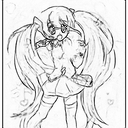

Train data : color image


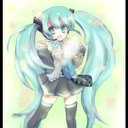

Train data : Generated image


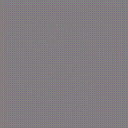

Train data : sketch image


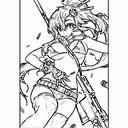

Train data : color image


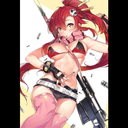

Train data : Generated image


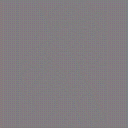

Train data : sketch image


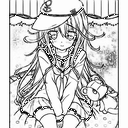

Train data : color image


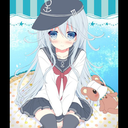

Train data : Generated image


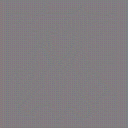

Validation data : sketch image


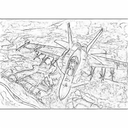

Validation data : color image


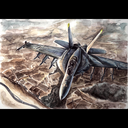

Validation data : Generated image


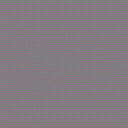

Validation data : sketch image


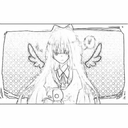

Validation data : color image


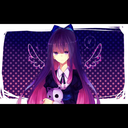

Validation data : Generated image


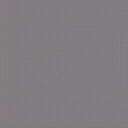

Validation data : sketch image


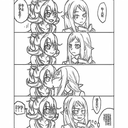

Validation data : color image


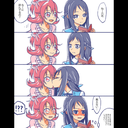

Validation data : Generated image


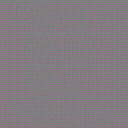

Saved model to disk


error: ignored

In [115]:
#Trained model for 165000 iterations (264 epochs) with batch size of 16.
training(62500,64)

In [41]:
from tensorflow.python.framework.ops import disable_eager_execution
disable_eager_execution()

In [ ]:
#Load weights with best results.
generator.load_weights('model_gen_135000.h5')

In [ ]:
#Show generated images from the trained model.

n_samples = 10 #Number of sample want to be printed.

#Resetting pointers to zero.
train_batch_pointer = 0
val_batch_pointer = 0

#Generate batch of skecth and corresponding color images from train data.
X_tr, Y_tr, res_tr = generate_train_batch(img_tr, n_samples, generator)

#Generate batch of skecth and corresponding color images from validation data.
X_val, Y_val, res_val = generate_val_batch(img_val, n_samples, generator)

#Generate batch of skecth and corresponding color images from test data.
X_ts, Y_ts, res_ts = generate_val_batch(img_tst, n_samples, generator)

#Resetting pointers to zero.
train_batch_pointer = 0
val_batch_pointer = 0

#Function to generate 10 generated image from each train, validation and test data.
def print_results():
  #gen_arr = model.predict(X_tr)
  #Generate image on 10 samples from train, test and validation data.
  for i in range(10):
    print('Train data : sketch image')
    #Convertng the generated image back to 0-255 value format.
    img = ((X_tr[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Train data : color image')
    #Convertng the generated image back to 0-255 value format.
    img = ((Y_tr[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Train data : Generated image')
    #Convertng the generated image back to 0-255 value format.
    img = ((res_tr[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)

  #Generate image on 10 samples from validation data.
  for i in range(10):
    print('Validation data : sketch image')
    #Convertng the generated image back to 0-255 value format.
    img = ((X_val[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Validation data : color image')
    #Convertng the generated image back to 0-255 value format.
    img = ((Y_val[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Validation data : Generated image')
    #Convertng the generated image back to 0-255 value format.
    img = ((res_val[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)

  #Generate image on 10 samples from test data.
  for i in range(10):
    print('Test data : sketch image')
    #Convertng the generated image back to 0-255 value format.
    img = ((X_ts[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Test data : color image')
    #Convertng the generated image back to 0-255 value format.
    img = ((Y_ts[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)
    print('Test data : Generated image')
    #Convertng the generated image back to 0-255 value format.
    img = ((res_ts[i]+ 1)/2.0)*255.0
    #Converting back to BGR format required by cv2 library.
    img = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR)
    #Show image.
    cv2_imshow(img)

Train data : sketch image


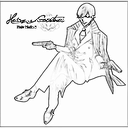

Train data : color image


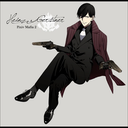

Train data : Generated image


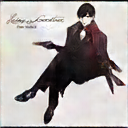

Train data : sketch image


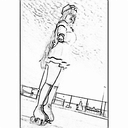

Train data : color image


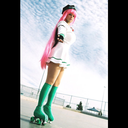

Train data : Generated image


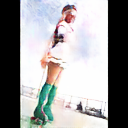

Train data : sketch image


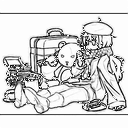

Train data : color image


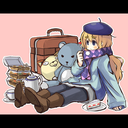

Train data : Generated image


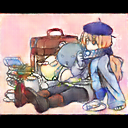

Train data : sketch image


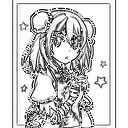

Train data : color image


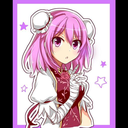

Train data : Generated image


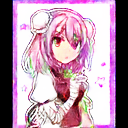

Train data : sketch image


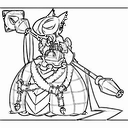

Train data : color image


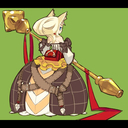

Train data : Generated image


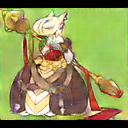

Train data : sketch image


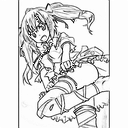

Train data : color image


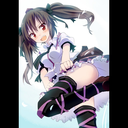

Train data : Generated image


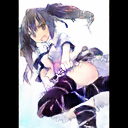

Train data : sketch image


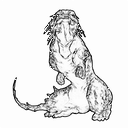

Train data : color image


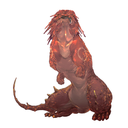

Train data : Generated image


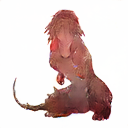

Train data : sketch image


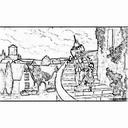

Train data : color image


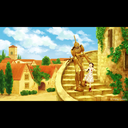

Train data : Generated image


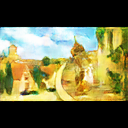

Train data : sketch image


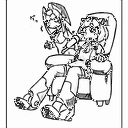

Train data : color image


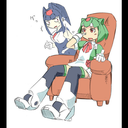

Train data : Generated image


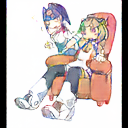

Train data : sketch image


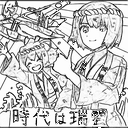

Train data : color image


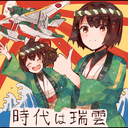

Train data : Generated image


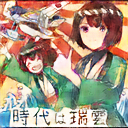

Validation data : sketch image


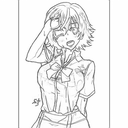

Validation data : color image


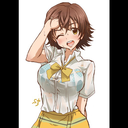

Validation data : Generated image


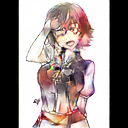

Validation data : sketch image


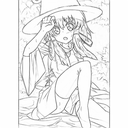

Validation data : color image


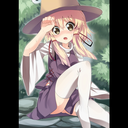

Validation data : Generated image


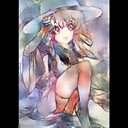

Validation data : sketch image


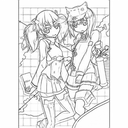

Validation data : color image


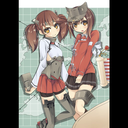

Validation data : Generated image


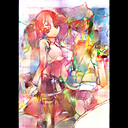

Validation data : sketch image


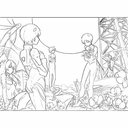

Validation data : color image


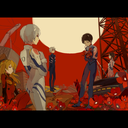

Validation data : Generated image


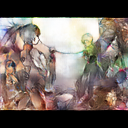

Validation data : sketch image


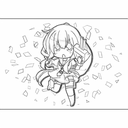

Validation data : color image


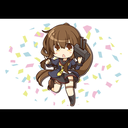

Validation data : Generated image


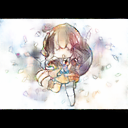

Validation data : sketch image


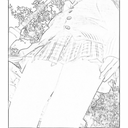

Validation data : color image


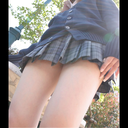

Validation data : Generated image


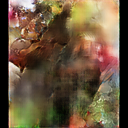

Validation data : sketch image


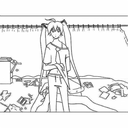

Validation data : color image


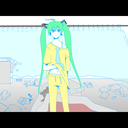

Validation data : Generated image


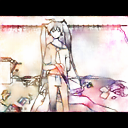

Validation data : sketch image


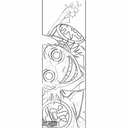

Validation data : color image


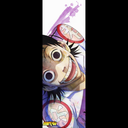

Validation data : Generated image


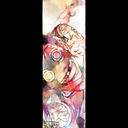

Validation data : sketch image


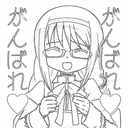

Validation data : color image


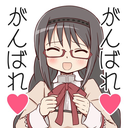

Validation data : Generated image


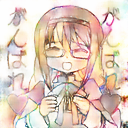

Validation data : sketch image


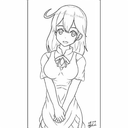

Validation data : color image


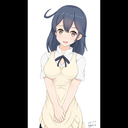

Validation data : Generated image


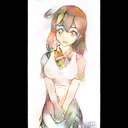

Test data : sketch image


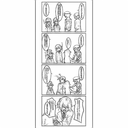

Test data : color image


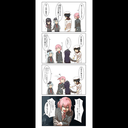

Test data : Generated image


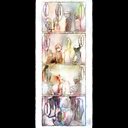

Test data : sketch image


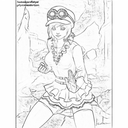

Test data : color image


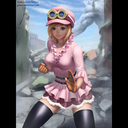

Test data : Generated image


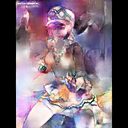

Test data : sketch image


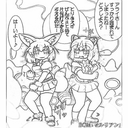

Test data : color image


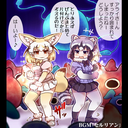

Test data : Generated image


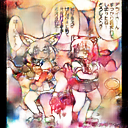

Test data : sketch image


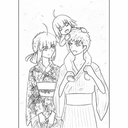

Test data : color image


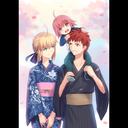

Test data : Generated image


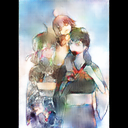

Test data : sketch image


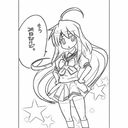

Test data : color image


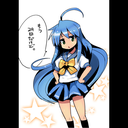

Test data : Generated image


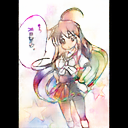

Test data : sketch image


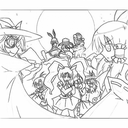

Test data : color image


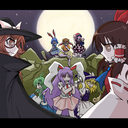

Test data : Generated image


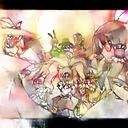

Test data : sketch image


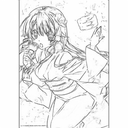

Test data : color image


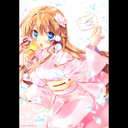

Test data : Generated image


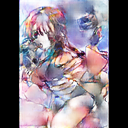

Test data : sketch image


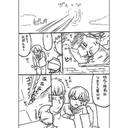

Test data : color image


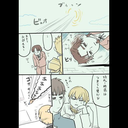

Test data : Generated image


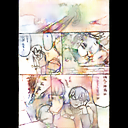

Test data : sketch image


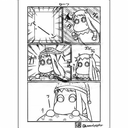

Test data : color image


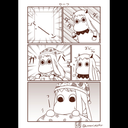

Test data : Generated image


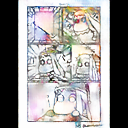

Test data : sketch image


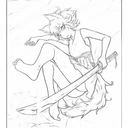

Test data : color image


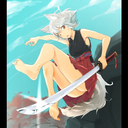

Test data : Generated image


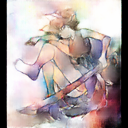

In [ ]:
#Generate images on some train, validation and test images using GAN model trained above.
print_results()

**6. Steps Followed**

- Downloaded data from Danbooru Sketch Pair 128x on kaggle https://www.kaggle.com/wuhecong/danbooru-sketch-pair-128xsv"
- Unzipped the folder.
- Imported all the required libraries. We have uses - Keras libraries, numpy, os, random, cv2, matplotlib.pyplot
- Loaded Train data - Sketches and Corresponding color images.
- Defined an U-net model.
- Trained model on train dataset and have saved weights. 
- Plotted train and test results.
- Loaded test data and generated image using model on train and test data.
- Then defined a GAN model. Defined below functions -
    - Generator
    - Discriminator
    - Pixel Level loss.
    - GAN
    - Generate Sample for batch processing
    - Plot history
    - Summarize performance.
    - Training
- Trained the GAN model and plotted results.
- Saved model weights.
- Generated images on train and test data using model generated above.




**7. Results**


*   Model performed well on sketches trained, but couldn't perform well on unseen images. Possible reason could be, we used less train data because of system constraints. 



**8. References**


*   https://machinelearningmastery.com/a-gentle-introduction-to-pix2pix-generative-adversarial-network/

*   https://machinelearningmastery.com/upsampling-and-transpose-convolution-layers-for-generative-adversarial-networks/

*   https://arxiv.org/pdf/1611.07004v1.pdf
*   https://machinelearningmastery.com/practical-guide-to-gan-failure-modes/


*   https://www.kaggle.com/wuhecong/danbooru-sketch-pair-128x
*   https://github.com/kvfrans/deepcolor/blob/master/main.py
- https://towardsdatascience.com/sketch-to-color-anime-translation-using-generative-adversarial-networks-gans-8f4f69594aeb
- https://arxiv.org/pdf/1808.03240.pdf
- http://kvfrans.com/coloring-and-shading-line-art-automatically-through-conditional-gans/
- https://arxiv.org/pdf/1705.01908v2.pdf





